### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [231]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

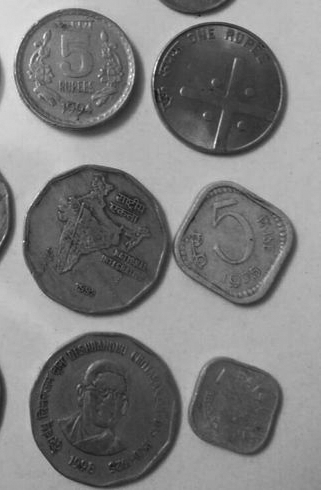

In [232]:
# 1A
monety_szare = cv2.imread('../dane/Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

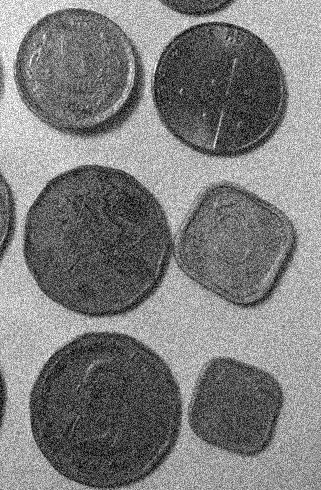

In [233]:
# 1B
monety_szare_szum = cv2.imread('../dane/Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

**Roziwązanie części 1A**

In [234]:
monety_szare = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)

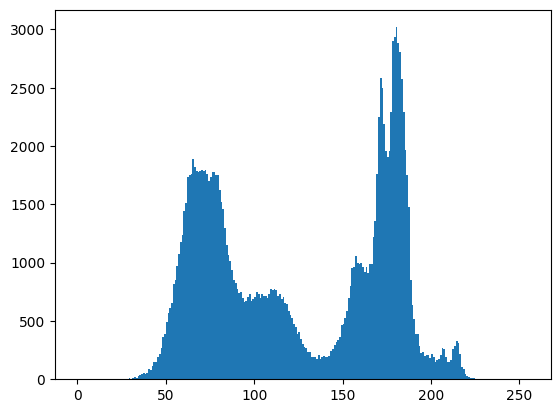

In [235]:
values = monety_szare.flatten()
_ = plt.hist(values, bins=range(256))

Na zdjęciu monety są ciemniejsze od tła, a tło jest w miarę jednolite - będzie przyjmowało podobne wartości na całej swojej powierzchni. Na histogranie widać dwa "piki" - jeden dla jaśneijszych (~170), a drugi dla ciemniejszych (~60) wartości. Dwa te historamy są mniej więcej rozdzielone, co może sugerować, że spadek między nimi (~140) może być odpowiednim progiem.

In [236]:
exp_t = [120, 130, 140, 145, 150, 160]

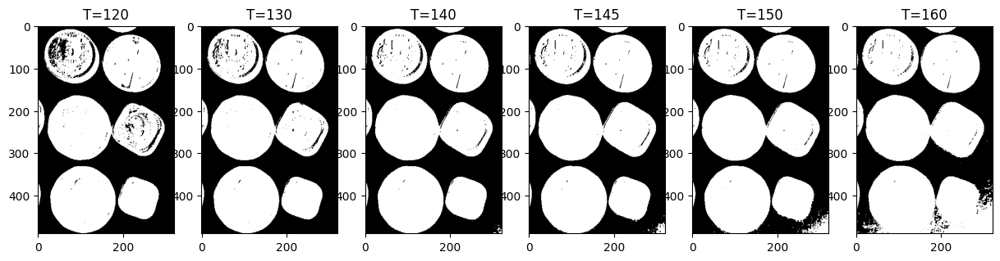

In [237]:
plt.figure(figsize=[15, 5])
for i, t in enumerate(exp_t):
    _, monety_t = cv2.threshold(monety_szare, t, 255, cv2.THRESH_BINARY_INV)
    plt.subplot(1, 6, i+1)
    plt.imshow(monety_t, cmap='gray')
    plt.title(f'T={t}')

Monety zostały najlepiej oddzielone od tła dla progu równego 130. Jedak niektóre fragmenty monet nie zostały odpowiednio zaklasyfikowane - monety są w tych miejsach jaśniejsze.

**OTSU**

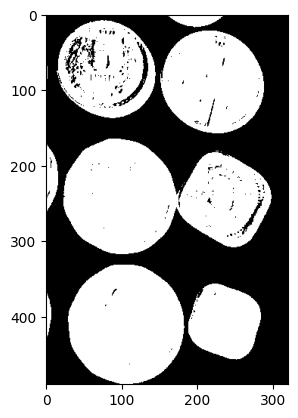

In [238]:
ret2,th2 = cv2.threshold(monety_szare,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(th2, cmap='gray')

**Roziwązanie części 1B**

In [239]:
monety_szare_szum = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)

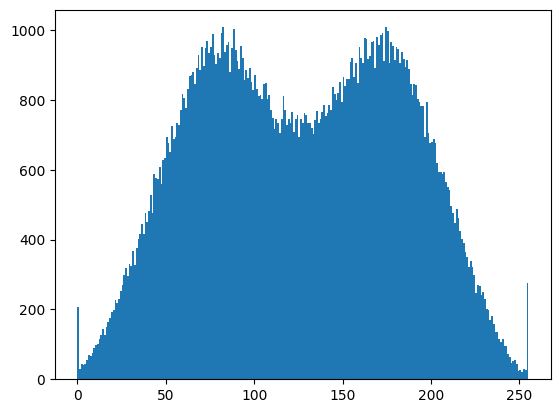

In [240]:
values = monety_szare_szum.flatten()
_ = plt.hist(values, bins=range(256))

Dużo cięzej jest określić odpowiedni próg - nie ma wyrażnego rozgraniczenia w wartościach. Zauważalny lekki spadek dla wartości ~130.

Text(0.5, 1.0, 'T=160')

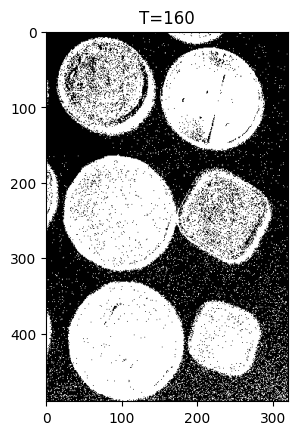

In [241]:

_, monety_t = cv2.threshold(monety_szare_szum, 130, 255, cv2.THRESH_BINARY_INV)
plt.imshow(monety_t, cmap='gray')
plt.title(f'T={t}')

Szum mocno zaburza generowanie maski, należy się go pozbyć.

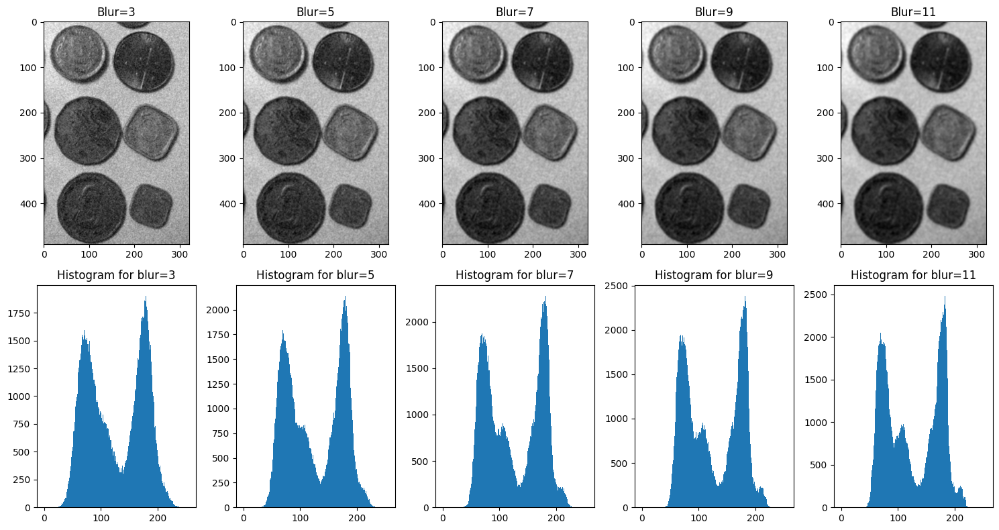

In [242]:
blur_size = [3, 5, 7, 9, 11]
plt.figure(figsize=[15,8])
for i, b in enumerate(blur_size):
    blur = cv2.GaussianBlur(monety_szare_szum,(b,b),0)
    pos = i+1
    plt.subplot(2,5,pos)
    plt.imshow(blur, cmap='gray')
    plt.title(f'Blur={b}')
    values = blur.flatten()
    plt.subplot(2,5, pos+5)
    _ = plt.hist(values, bins=range(256))
    plt.title(f'Histogram for blur={b}')
plt.tight_layout()


Zastosowanie filtru Gaussowskiego o rozmiarze 7 powinno być wystarczające - nie ma znaczącej róznicy między wyższymi rozmiarami. Wykorzystano dalej algorytm progowania OSTU.

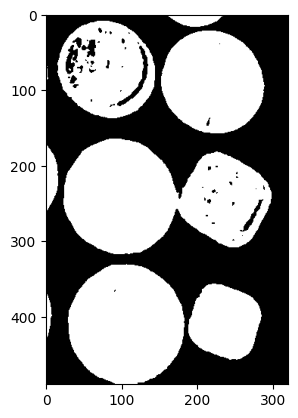

In [243]:
img_blur = cv2.GaussianBlur(monety_szare_szum,(7,7),0)
ret2,th2 = cv2.threshold(img_blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(th2, cmap='gray')

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

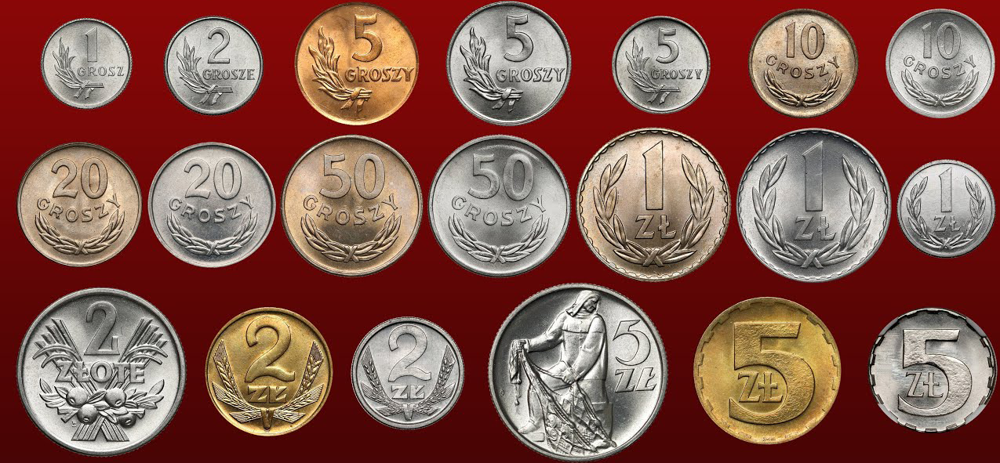

In [244]:
# 2A
monety_kolor = cv2.imread('../dane/Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

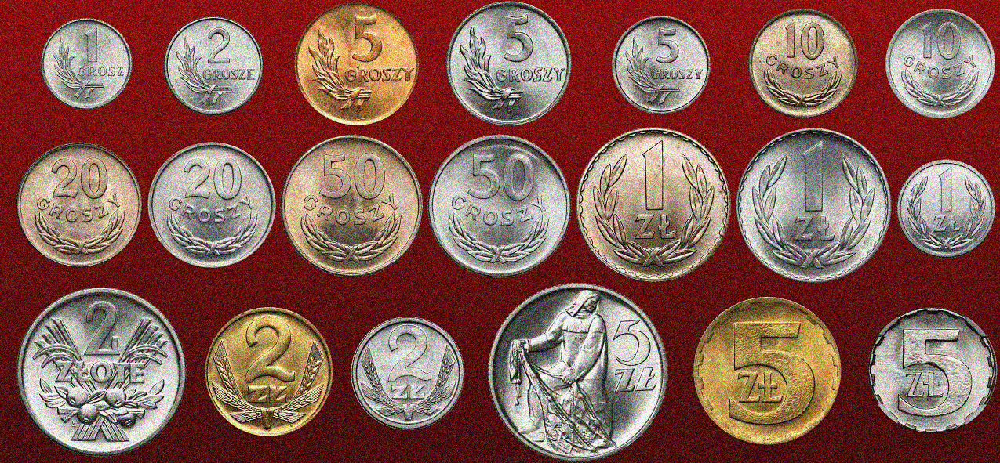

In [245]:
# 2B
monety_kolor_szum = cv2.imread('../dane/Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

**Rozwiązanie części 2A:**

Test na zwykłym BW:

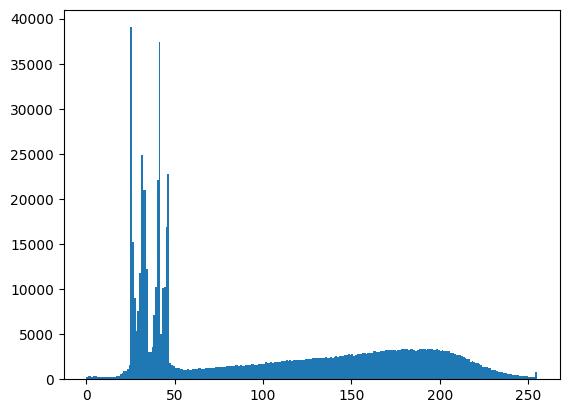

In [246]:
monety_kolor_gray = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2GRAY)
values = monety_kolor_gray.flatten()
_ = plt.hist(values, bins=range(256))

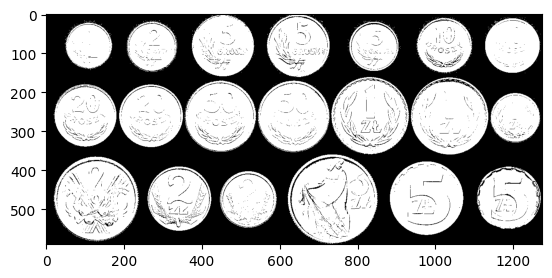

In [247]:
_, monety_t = cv2.threshold(monety_kolor_gray, 50, 255, cv2.THRESH_BINARY)
plt.imshow(monety_t, cmap='gray')

I na HSV:

Text(0.5, 1.0, 'V channel histogram')

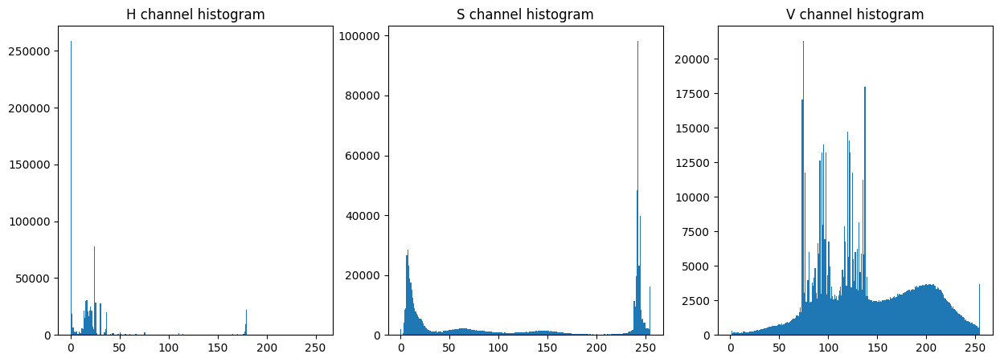

In [248]:
monety_HSV = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(monety_HSV)

plt.figure(figsize=[15,5])
plt.subplot(1,3,1)
h_values = h.flatten()
_ = plt.hist(h_values, bins=range(256))
plt.title('H channel histogram')
plt.subplot(1,3,2)
s_values = s.flatten()
_ = plt.hist(s_values, bins=range(256))
plt.title('S channel histogram')
plt.subplot(1,3,3)
v_values = v.flatten()
_ = plt.hist(v_values, bins=range(256))
plt.title('V channel histogram')


Największa rózica jest widoczna dla kanału S. Największe nasycenie - barwy czerowne ze zdjęcia - osiągają wysokie watosći >230.

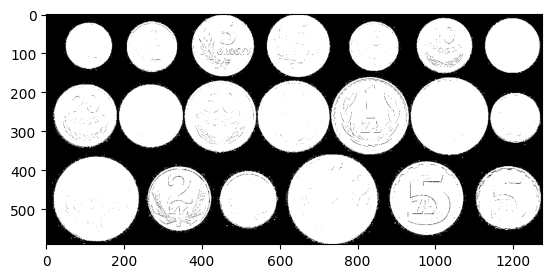

In [259]:
_, monety_t = cv2.threshold(s, 230, 255, cv2.THRESH_BINARY_INV)
plt.imshow(monety_t, cmap='gray')

Maska jest dokładniejsza niż przy progowaniu w skali szarości

**Rozwiązanie części 2B:**


Skala BW:

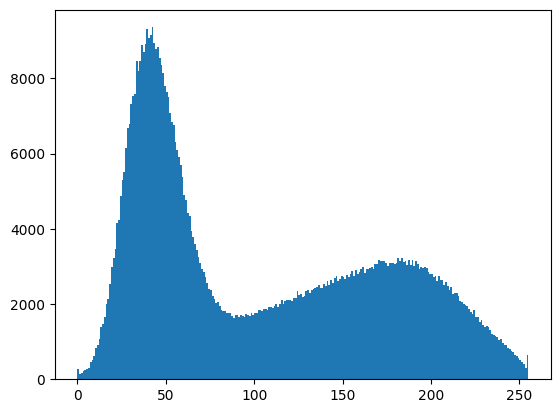

In [203]:
monety_kolor_szum_gray = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2GRAY)
values = monety_kolor_szum_gray.flatten()
_ = plt.hist(values, bins=range(256))

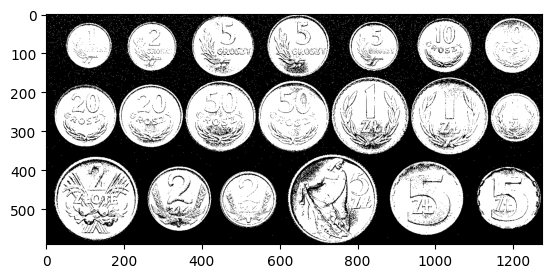

In [213]:
_, monety_t = cv2.threshold(monety_kolor_szum_gray, 80, 255, cv2.THRESH_BINARY)
plt.imshow(monety_t, cmap='gray')

Szum jest zauważalny

HSV:

Text(0.5, 1.0, 'V channel histogram')

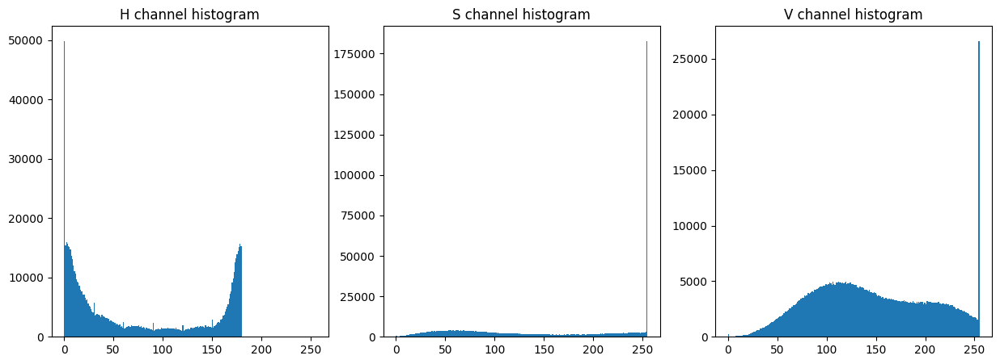

In [205]:
monety_HSV = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(monety_HSV)

plt.figure(figsize=[15,5])
plt.subplot(1,3,1)
h_values = h.flatten()
_ = plt.hist(h_values, bins=range(256))
plt.title('H channel histogram')
plt.subplot(1,3,2)
s_values = s.flatten()
_ = plt.hist(s_values, bins=range(256))
plt.title('S channel histogram')
plt.subplot(1,3,3)
v_values = v.flatten()
_ = plt.hist(v_values, bins=range(256))
plt.title('V channel histogram')

Największe rozrównienie dla HUE

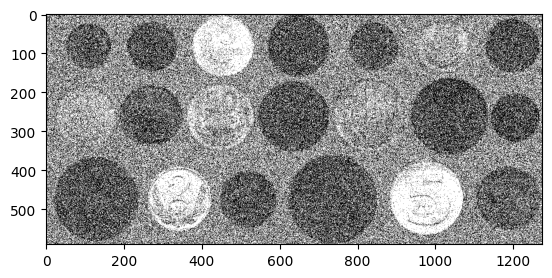

In [208]:
_, monety_t = cv2.threshold(h, 50, 255, cv2.THRESH_BINARY_INV)
plt.imshow(monety_t, cmap='gray')

Dane zbyt zaszumione

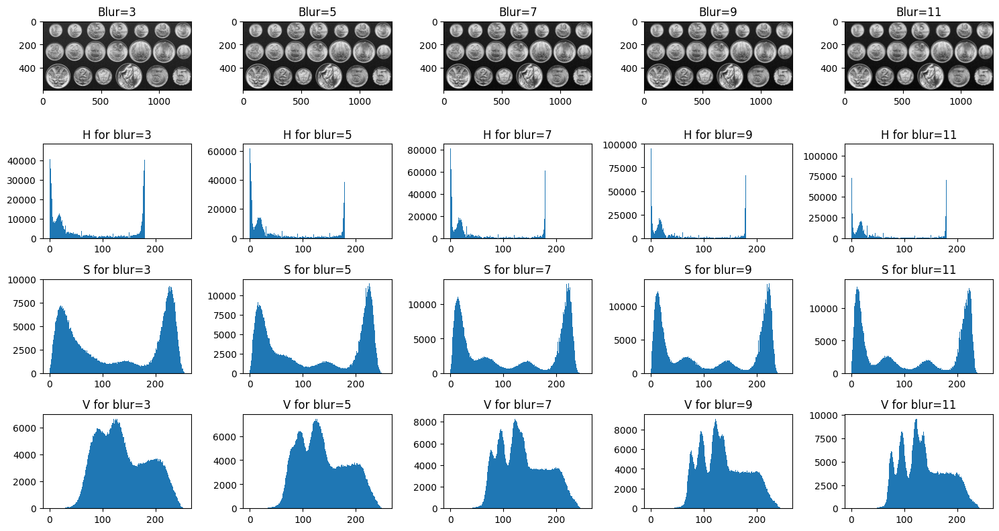

In [215]:
blur_size = [3, 5, 7, 9, 11]
plt.figure(figsize=[15,8])
for i, b in enumerate(blur_size):
    blur = cv2.GaussianBlur(monety_kolor_szum,(b,b),0)
    monety_HSV = cv2.cvtColor(blur, cv2.COLOR_BGR2HSV)
    h,s,v = cv2.split(monety_HSV)
    pos = i+1
    plt.subplot(4,5,pos)
    plt.imshow(cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY), cmap='gray')
    plt.title(f'Blur={b}')

    h_values = h.flatten()
    plt.subplot(4,5, pos+5)
    _ = plt.hist(h_values, bins=range(256))
    plt.title(f'H for blur={b}')
    s_values = s.flatten()
    plt.subplot(4,5, pos+10)
    _ = plt.hist(s_values, bins=range(256))
    plt.title(f'S for blur={b}')
    v_values = v.flatten()
    plt.subplot(4,5, pos+15)
    _ = plt.hist(v_values, bins=range(256))
    plt.title(f'V for blur={b}')
plt.tight_layout()

Ponownie, największe rozróżnienie wartości występuje dla wartości Saturation (S). Ponownie wybrano wielkośc filrta 7.

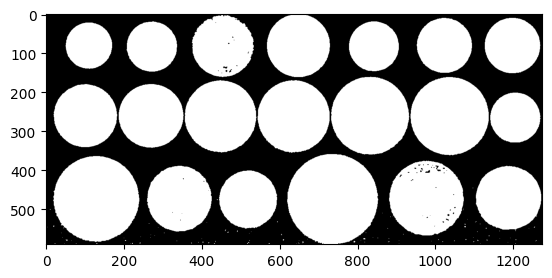

In [227]:
blur = cv2.GaussianBlur(monety_kolor_szum,(7,7),0)
monety_HSV = cv2.cvtColor(blur, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(monety_HSV)
_, monety_t = cv2.threshold(s, 180, 255, cv2.THRESH_BINARY_INV)
plt.imshow(monety_t, cmap='gray')

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

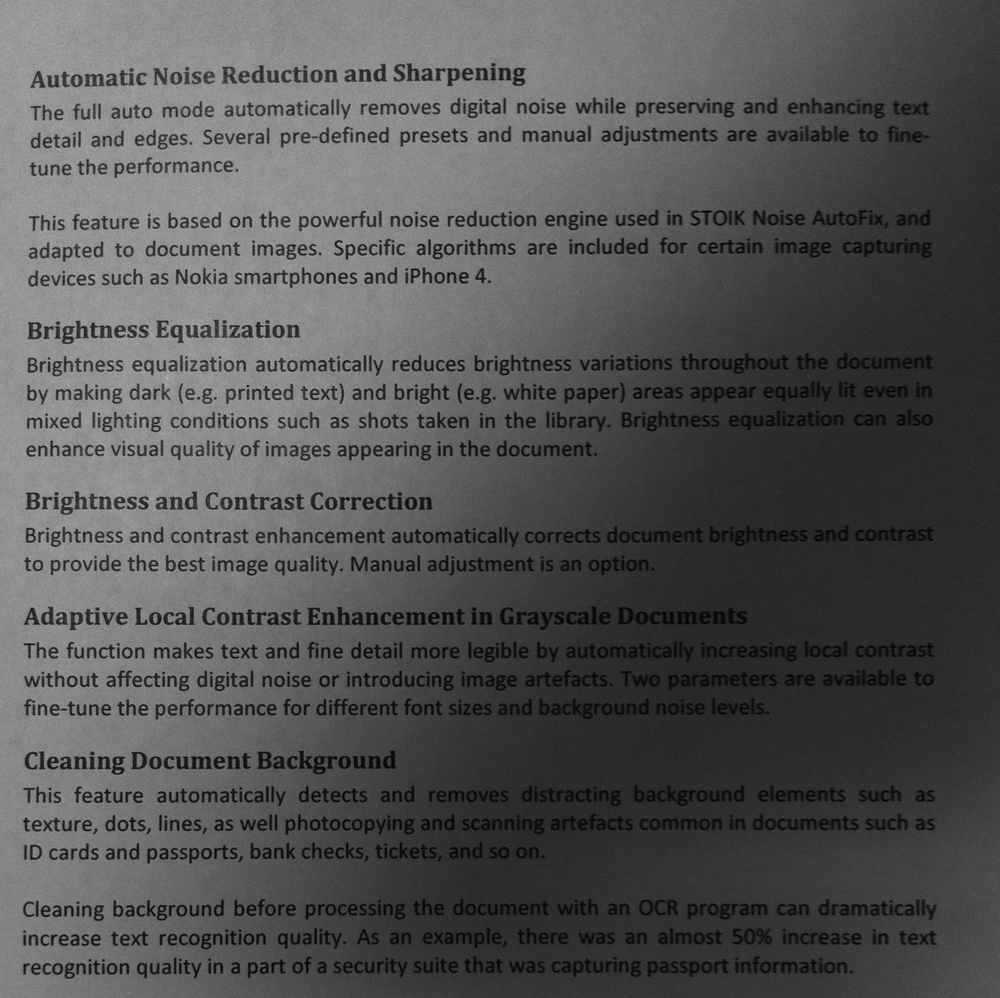

In [228]:
tekst = cv2.imread('../dane/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

In [229]:
tekst_gray = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)

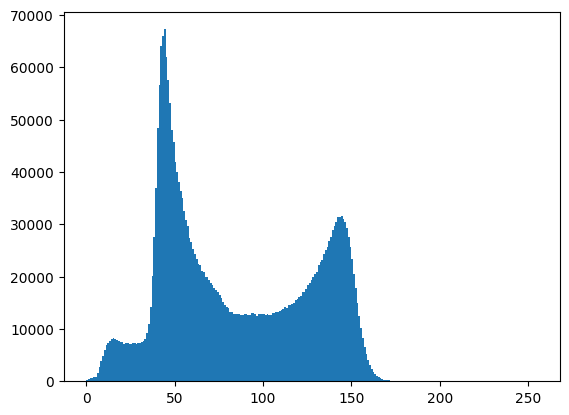

In [262]:
_ = plt.hist(tekst_gray.flatten(), bins=range(256))

OTSU:

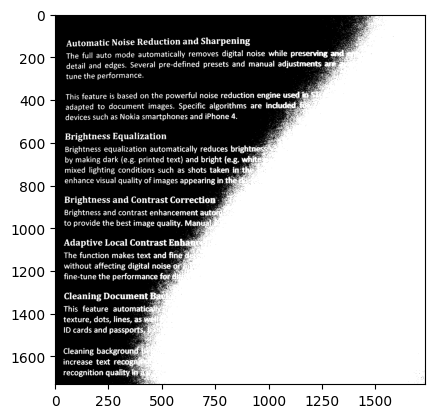

In [263]:
ret2,th2 = cv2.threshold(tekst_gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)


Adaptive threshold z bibblioteki

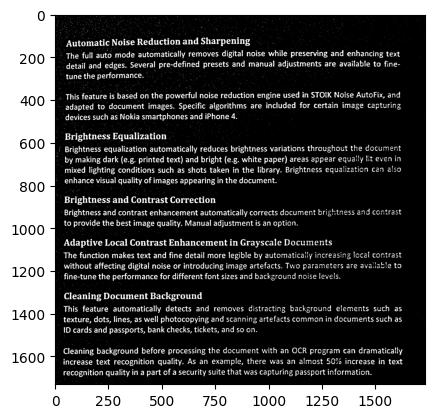

In [275]:
adaptive = cv2.adaptiveThreshold(tekst_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 25, 13)
plt.imshow(adaptive, cmap='gray')

**Implementacja Adaptive Threshold:**

In [317]:
def custom_adaptive_threshold(img, block_size, C):
    img_out = np.zeros_like(img)
    for i in range(0, img.shape[0], block_size):
        for j in range(0, img.shape[1], block_size):
            block = img[i:i+block_size, j:j+block_size]
            t = np.mean(block) - C
            _, block = cv2.threshold(block, t, 255, cv2.THRESH_BINARY_INV)
            img_out[i:i+block_size, j:j+block_size] = block
    return img_out

In [320]:
tekst_gray.shape

(1731, 1734)

Wpływ rozmiru okna

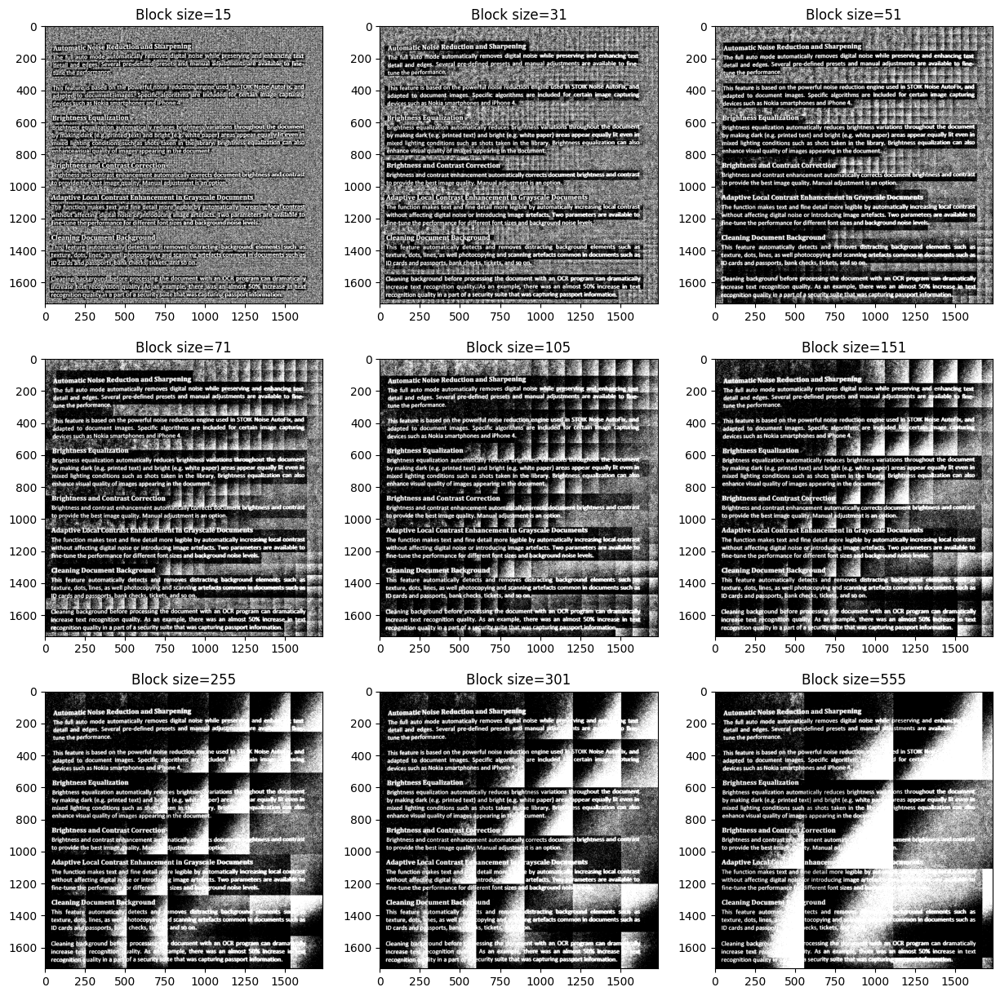

In [323]:
c = 0
blocks = [ 15, 31, 51, 71, 105, 151, 255, 301, 555]    
plt.figure(figsize=[15,15])
for i, b in enumerate(blocks):
    img_out = custom_adaptive_threshold(tekst_gray, b, c)
    plt.subplot(3,3,i+1)
    plt.imshow(img_out, cmap='gray')
    plt.title(f'Block size={b}')

Czym mniejszy rozmiar okna tym bardziej `szczegółowe` jest progowanie, jednak zbyt mały rozmiar może wprawodzić dużo szumu - w małym bloku o mniej-więcej jednolitym kolorze będzie duża różnorodność wartości - mimo spodziewanej jednakowej (Jak wyżej dla rozmiaru 15). Większy rozmiar powoduje mniejszą `szczegółowość*, przez co niektóre elementy mogą być słabo widoczne - jak dla rozmiaru 555 wyżej

Dla powyższego przykładu dobry dla dalszej analizy może być rozmiar 51.

Wpływ stałej C:

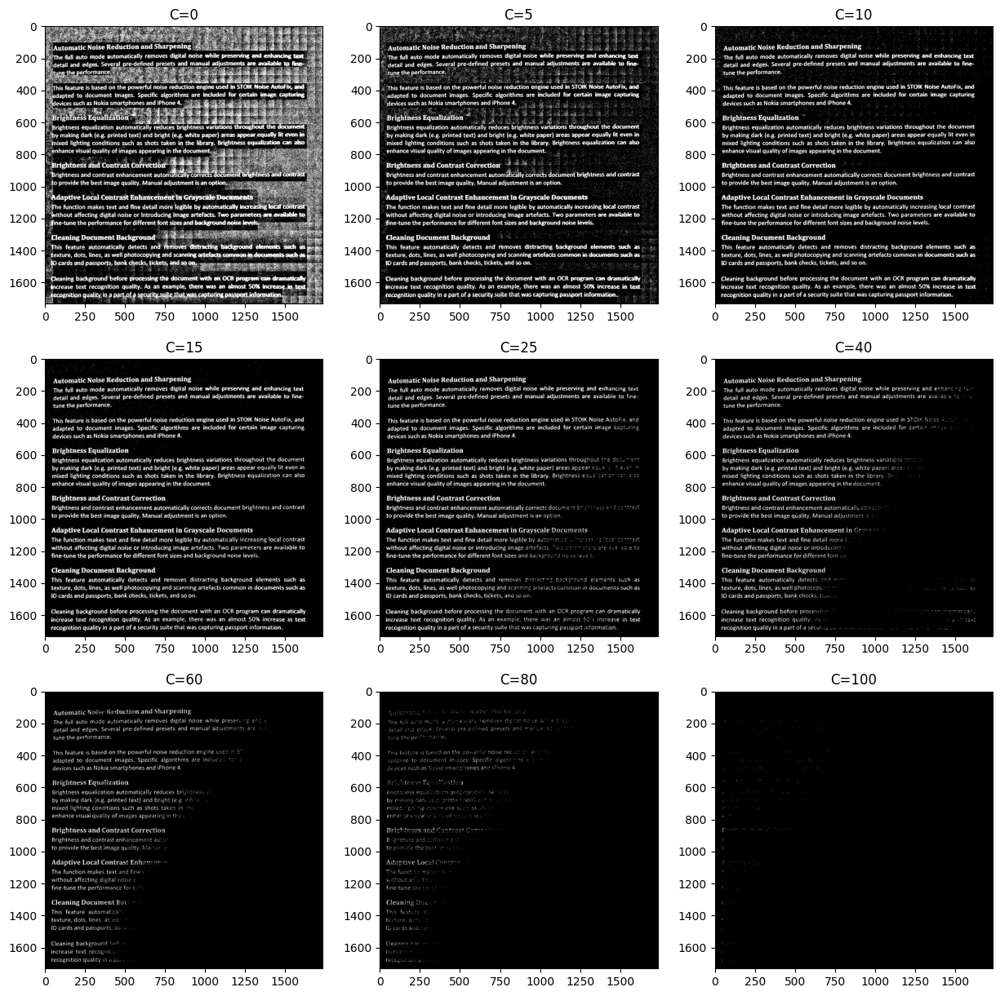

In [326]:
b = 51
cs = [0, 5, 10, 15, 25, 40, 60, 80, 100]
plt.figure(figsize=[15,15])
for i, c in enumerate(cs):
    img_out = custom_adaptive_threshold(tekst_gray, b, c)
    plt.subplot(3,3,i+1)
    plt.imshow(img_out, cmap='gray')
    plt.title(f'C={c}')

Stała C służy do dostosowania progu, tak aby uzględnić kontrast między obiektem a tłem. Uwzględnienie zmiennej C wpyłwa na zmniejszenie szumów. Podobnie jak w przypadku jednolitego tła, wykorzystanie jako progu wartości średniej spowoduje, że niektóre pixele będą poniżej a niektóre powyżej progu - wprowaadzenie szumu. Uwzględnienie C, wpływa na obniżenie progu, przez co  większosć/całość pixeli będzie ponad nim (lub poniżej przy ujemnym C). Wykorzystanie zbyt dużego C może doprowadzić do sytuacji, gdy większość/całość pixeli znajdzie się ponad progiem, co uniemożliwi ekstrakcję szczegółów.

Wybrane parametry:
- block_size = 51
- C = 15

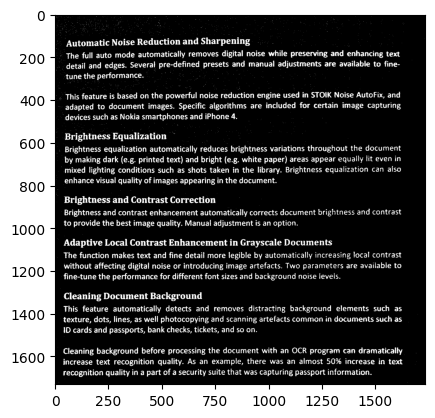

In [324]:
cust_adaptive = custom_adaptive_threshold(tekst_gray, 51, 15)
plt.imshow(cust_adaptive, cmap='gray')